In [1]:
# ----------------------------------------------------------------------------
#
# TITLE - potential_fitting.ipynb
# AUTHOR - James Lane
# PROJECT - AST 1501
#
# ----------------------------------------------------------------------------
#
# Docstrings and metadata:
'''Fit the Kuijken & Tremaine model to the MWPotential2014 + triaxial halo model.
'''

__author__ = "James Lane"

In [2]:
### Imports

## Basic
import numpy as np
import sys, os, pdb

## Plotting
from matplotlib import pyplot as plt

## galpy
from galpy import potential

## Astropy
import astropy.units as apu

## Fitting
from scipy.optimize import curve_fit

## Project specific
sys.path.append('../../src/')
import ast1501.potential

In [3]:
# Matplotlib for notebooks
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# Meta

## Future work

## Information
- Kuijken & Tremaine model: https://ui.adsabs.harvard.edu/#abs/1994ApJ...421..178K/abstract

# Define functions

In [4]:
def kuijken_model(x,vc,alpha,psi0,p):
    
    if alpha != 0:
        axi_component = ( vc**2 / ( 2 * alpha ) ) * ( x[0] / 8 )**( 2 * alpha )
    else:
        axi_component = ( vc**2 ) * np.log( x[0] )
    ##ie
    
    nonaxi_component = ( psi0*( x[0] / 8 )**(p) ) * ( np.cos( 2*( x[1] ) ) )
    
    return axi_component + nonaxi_component
#def

# Make the data to fit
Make MWPotential2014 and replace the normal halo with the triaxial halo

In [7]:
# First declare the data space. Fit a grid from 5-15 kpc in radius and -pi to pi in azimuth
R_limits = [5,15]
phi_limits = [-np.pi,np.pi]
R_range = np.linspace( R_limits[0], R_limits[1], 100 )
phi_range = np.linspace( phi_limits[0], phi_limits[1], 100 )
R_mesh, phi_mesh = np.meshgrid( R_range, phi_range )
mesh_size = R_mesh.shape

# Make into a 2D array that can be fed into the function
Rs = R_mesh.flatten()
phis = phi_mesh.flatten()
xdata = np.vstack((Rs,phis))

In [8]:
# Make the galpy data
mwpot_trihalo = ast1501.potential.make_MWPotential2014_triaxialNFW(halo_b=1.1)

pot = np.zeros_like(Rs)
for i in range( len(pot) ):
    pot[i] = potential.evaluatePotentials( mwpot_trihalo, R=Rs[i]/8, z=0, phi=phis[i] ).value
###i

pot_inf = potential.evaluatePotentials( mwpot_trihalo, R=100000, z=0, phi=0 ).value
pot -= pot_inf

# Example fit

In [9]:
# Now fit
popt, pcov = curve_fit(kuijken_model, xdata, pot, p0=[220,-1.5,1000,-0.5] )

In [10]:
variables = ['vc','alpha','psi0','p']
for i in range(len(popt)):
    print( variables[i] + ': ' + str(popt[i]) )
###i

print('\n\n')
print(pcov)

vc: 222.58759912056308
alpha: -0.17951893805551852
psi0: 374.9860906232252
p: 0.41218412321597186



[[ 8.30912140e-04 -1.27595022e-06  1.39103759e-03 -1.73053555e-05]
 [-1.27595022e-06  1.98340545e-09 -1.76944708e-06  2.61840316e-08]
 [ 1.39103759e-03 -1.76944708e-06  4.06000089e+01 -1.83905324e-01]
 [-1.73053555e-05  2.61840316e-08 -1.83905324e-01  1.94473014e-03]]


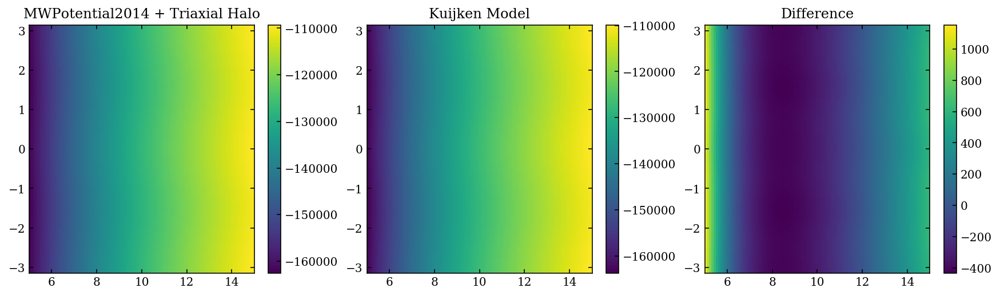

In [11]:
fig = plt.figure( figsize=(15,4) )

plt.subplot(1, 3, 1)
plt.title("MWPotential2014 + Triaxial Halo")
plt.pcolormesh(R_mesh, phi_mesh, pot.reshape(mesh_size) )
plt.axis( [ R_limits[0], R_limits[1], phi_limits[0], phi_limits[1] ] )
plt.colorbar()

plt.subplot(1, 3, 2)
plt.title("Kuijken Model")
plt.pcolormesh( R_mesh, phi_mesh, kuijken_model(xdata, *popt).reshape(mesh_size) )
plt.axis( [ R_limits[0], R_limits[1], phi_limits[0], phi_limits[1] ] )
plt.colorbar()

plt.subplot(1, 3, 3)
plt.title("Difference")
plt.pcolormesh( R_mesh, phi_mesh, pot.reshape(mesh_size) - kuijken_model(xdata, *popt).reshape(mesh_size) )
plt.axis( [ R_limits[0], R_limits[1], phi_limits[0], phi_limits[1] ] )
plt.colorbar()

pass;

# Fit a range of b

In [20]:
b_values = np.linspace( 0.7, 1.3, num=14, endpoint=True )
n_bs = len(b_values)
n_variables = 4
variable_storage = np.zeros( ( n_bs, n_variables ) )
variable_names = [r'$v_{c} [km/s]$',r'$\alpha$',r'$\psi_{0}$ [km$^{2}$/s$^{2}$]',r'$p$']

[ 2.13938476e+02 -2.11335183e-01 -1.04913953e+03  3.11956029e-01]
[ 2.15194799e+02 -2.06633129e-01 -9.02633959e+02  3.23075597e-01]
[ 2.16370405e+02 -2.02270573e-01 -7.48863596e+02  3.33161858e-01]
[ 2.17472211e+02 -1.98208594e-01 -5.89266924e+02  3.42002728e-01]
[ 2.18506407e+02 -1.94414263e-01 -4.25069692e+02  3.48937841e-01]
[ 2.19478544e+02 -1.90859508e-01 -2.57314760e+02  3.51426716e-01]
[ 2.20393617e+02 -1.87520231e-01 -8.68602505e+01  3.27615562e-01]
[ 2.21256096e+02 -1.84375570e-01  8.52595695e+01  4.44464857e-01]
[ 2.22070077e+02 -1.81407484e-01  2.58868165e+02  4.12796077e-01]
[ 2.22839202e+02 -1.78600111e-01  4.33111414e+02  4.12988295e-01]
[ 2.23566799e+02 -1.75939557e-01  6.07561695e+02  4.17141086e-01]
[ 2.24255883e+02 -1.73413556e-01  7.81819246e+02  4.22380843e-01]
[ 2.24909199e+02 -1.71011230e-01  9.55541867e+02  4.27950737e-01]
[ 2.25529246e+02 -1.68722901e-01  1.12843763e+03  4.33577026e-01]


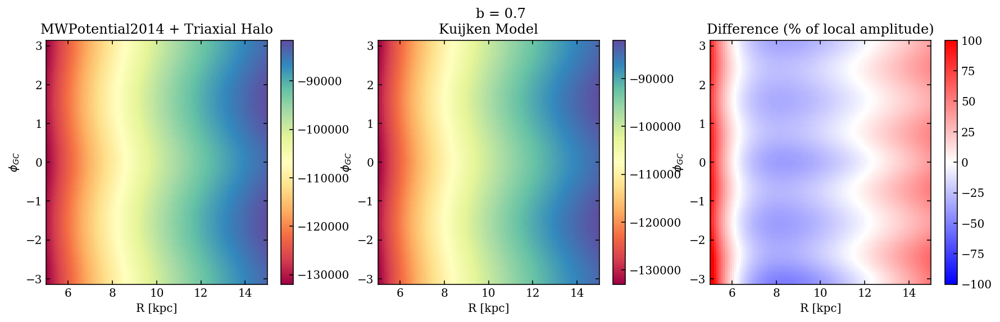

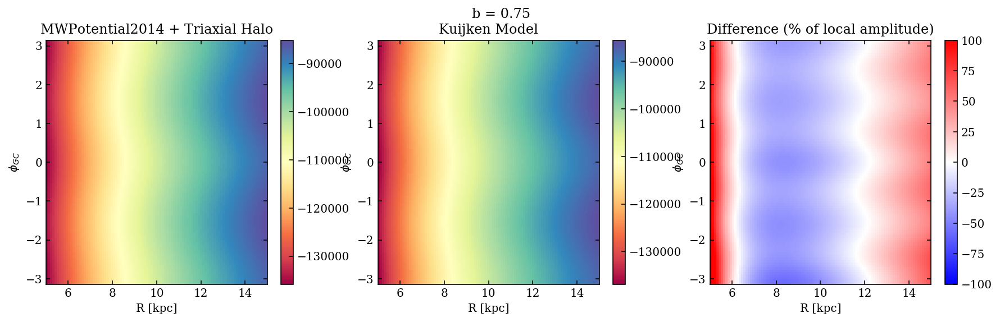

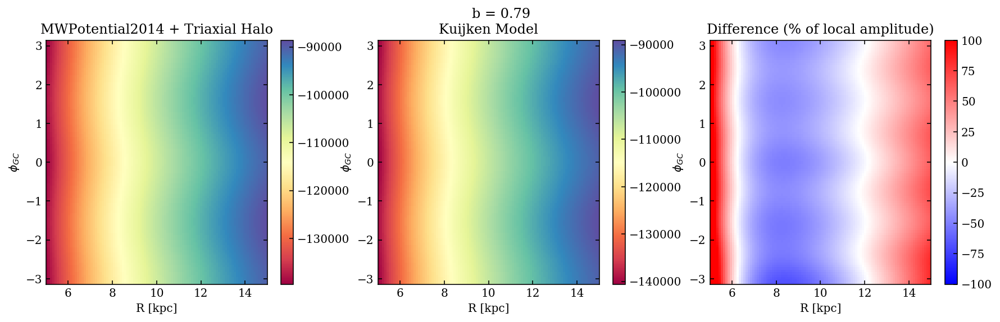

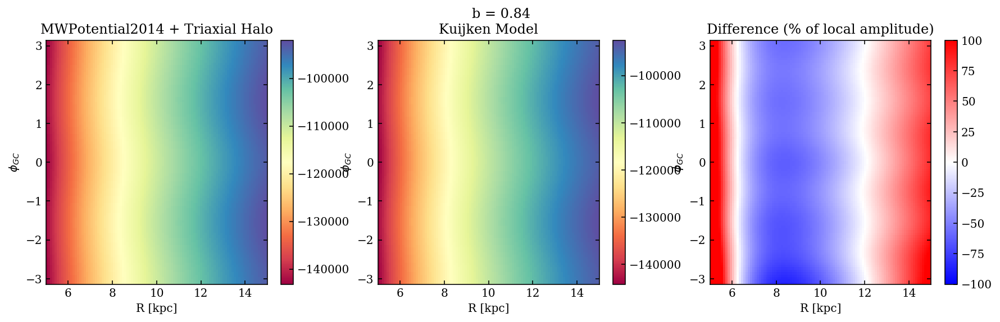

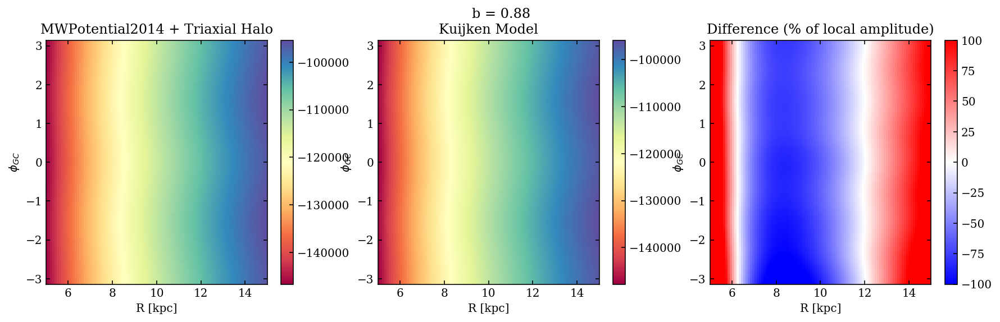

...

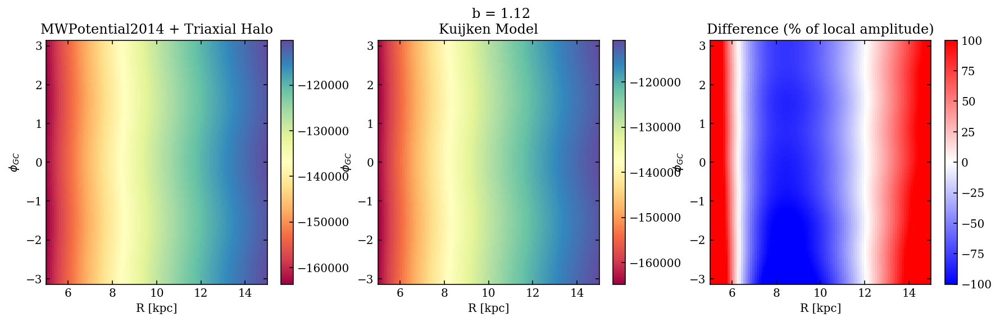

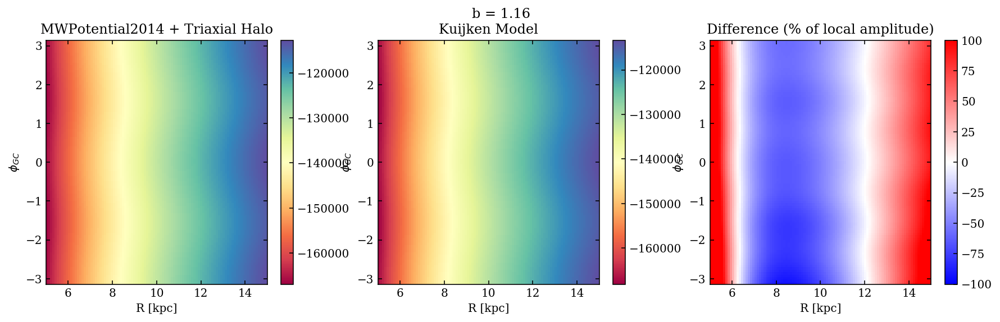

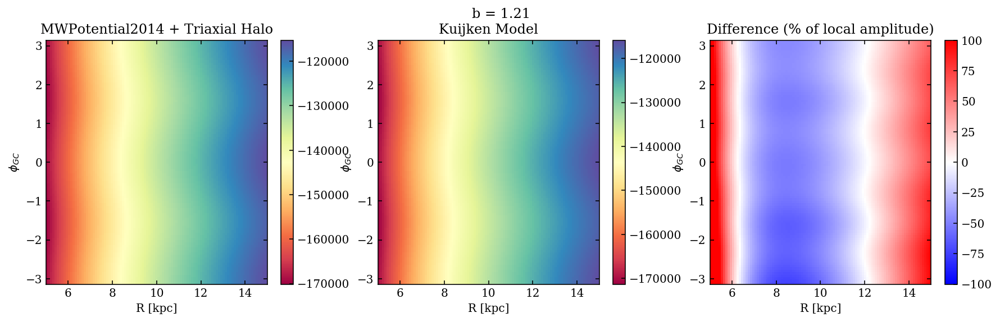

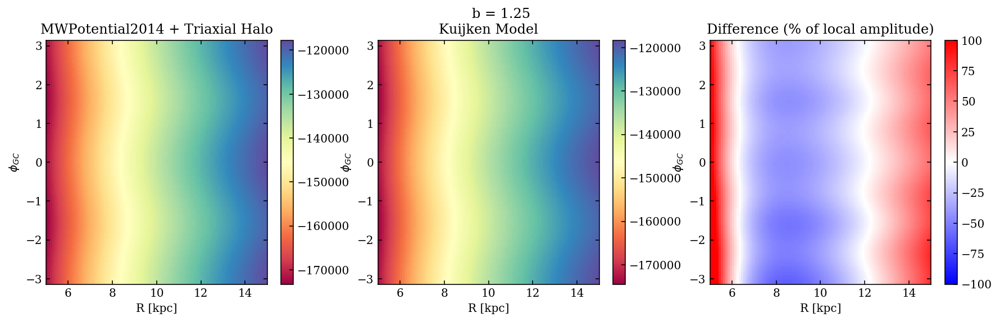

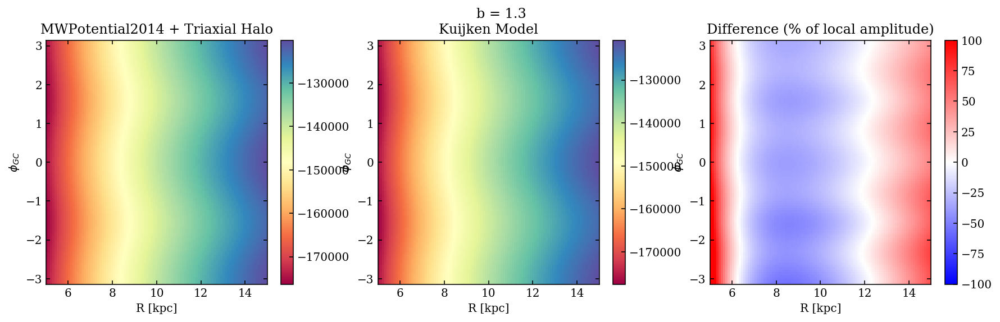

In [21]:
for i in range( n_bs ):
    
    # Make the galpy data
    mwpot_trihalo = ast1501.potential.make_MWPotential2014_triaxialNFW(halo_b=b_values[i])
    pot = np.zeros_like(Rs)
    for j in range( len(pot) ):
        pot[j] = potential.evaluatePotentials( mwpot_trihalo, R=Rs[j]/8, z=0, phi=phis[j] ).value
    ###i
    pot_inf = potential.evaluatePotentials( mwpot_trihalo, R=100000, z=0, phi=0 ).value
    pot -= pot_inf
    
    # Now fit
    popt, pcov = curve_fit(kuijken_model, xdata, pot, p0=[220,-1.5,1000,-0.5] )
    
    # Store the output
    print(popt)
    variable_storage[i,:] = popt
    
    # Now plot
    fig = plt.figure( figsize=(15,4) )

    plt.subplot(1, 3, 1)
    plt.title("MWPotential2014 + Triaxial Halo")
    plt.pcolormesh(R_mesh, phi_mesh, pot.reshape(mesh_size), cmap='Spectral')
    plt.axis( [ R_limits[0], R_limits[1], phi_limits[0], phi_limits[1] ] )
    plt.xlabel('R [kpc]')
    plt.ylabel(r'$\phi_{GC}$')
    plt.colorbar()

    plt.subplot(1, 3, 2)
    plt.title("Kuijken Model")
    plt.pcolormesh( R_mesh, phi_mesh, kuijken_model(xdata, *popt).reshape(mesh_size), cmap='Spectral' )
    plt.axis( [ R_limits[0], R_limits[1], phi_limits[0], phi_limits[1] ] )
    plt.xlabel('R [kpc]')
    plt.ylabel(r'$\phi_{GC}$')
    plt.colorbar()

    plt.subplot(1, 3, 3)
    plt.title("Difference (% of local amplitude)")
    pot_Ravg_sub = pot.reshape(mesh_size) - np.mean( pot.reshape(mesh_size), 0 ) # Average of each R is subtracted
    pot_Ravg_sub_max = np.amax( pot_Ravg_sub, axis=0 )
    pot_Ravg_sub_max_grid = np.repeat( pot_Ravg_sub_max[:, np.newaxis], pot_Ravg_sub_max.shape[0], axis=1)
    plt.pcolormesh( R_mesh, phi_mesh, 
                   100*np.divide(pot.reshape(mesh_size) - kuijken_model(xdata, *popt).reshape(mesh_size),
                                 pot_Ravg_sub_max_grid), cmap='bwr', vmin=-100, vmax=100 
                  )
    plt.axis( [ R_limits[0], R_limits[1], phi_limits[0], phi_limits[1] ] )
    plt.xlabel('R [kpc]')
    plt.ylabel(r'$\phi_{GC}$')
    plt.colorbar()
    
    plt.suptitle('b = '+str(round(b_values[i],2)) )

    pass;
###i

## Plot the parameter values as a function of b/a

Fit a power law of the form:

$
f(b) = A(b)^{k} + d
$

or 

$
f(b) = A(b-c)^{k} + d
$

A = 55019.964
k = 0.0
d = -54799.216


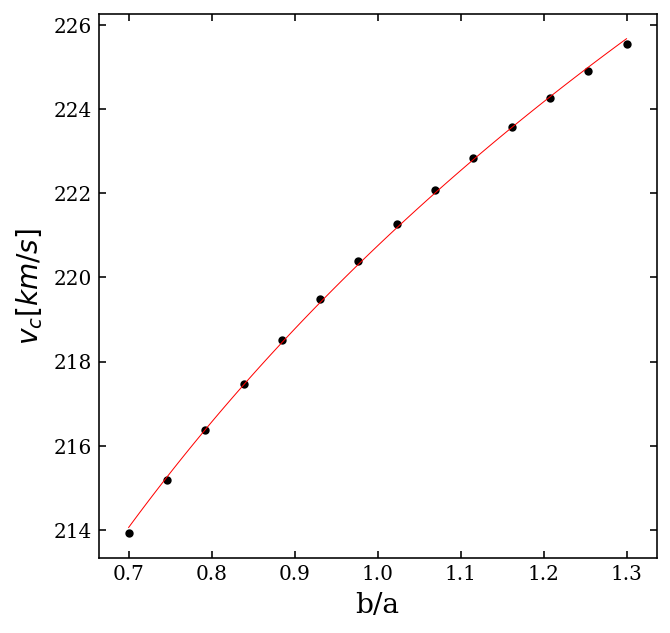

A = 186.565
k = 0.0
d = -186.751


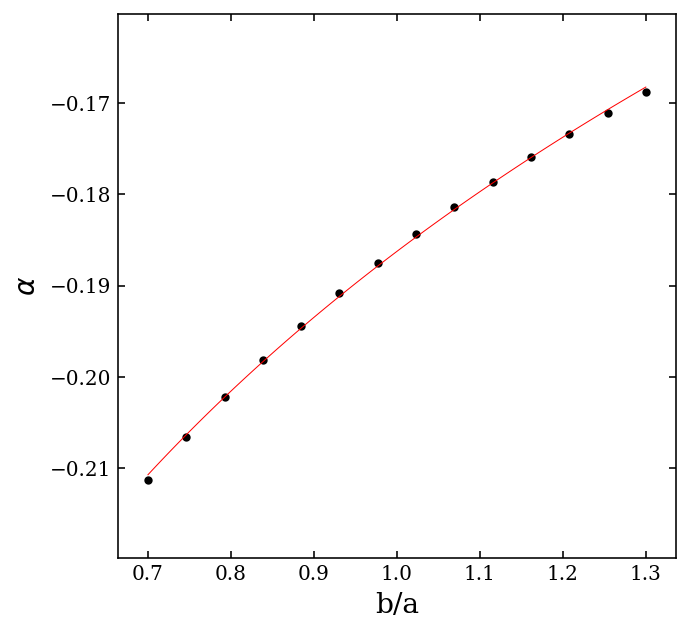

A = 2948.085
k = 1.245
d = -2950.065


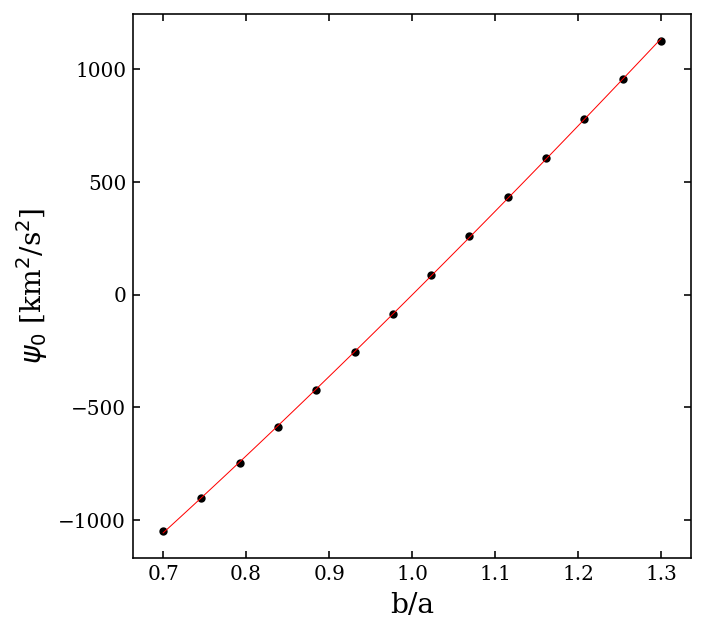

/Users/JamesLane/Software/Python/anaconda3/envs/ast1501-dev/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in power
  

b/a less than 1.0
A = 37.209
c = -0.69
k = 0.0003
d = -35.853
b/a greater than 1.0
A = 29.525
c = 29.525
k = 6.662
d = 1.422


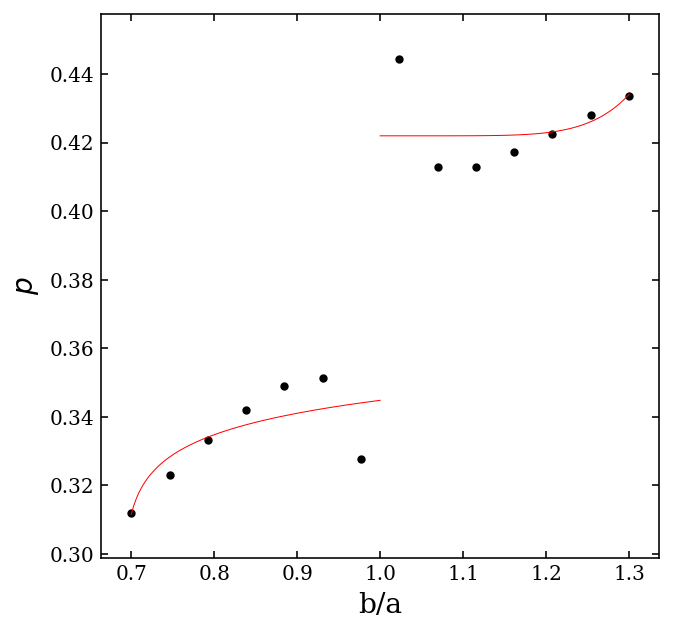

In [22]:
# Now plot the variables

def power_law(x,A,k,d):
    return A*np.power(x,k)+d
#def

def offset_power_law(x,A,c,k,d):
    return A*np.power(x+c,k)+d
#def

def offset_power_law_force(x,A,k,d):
    return A*np.power(x-0.99,k)+d

for i in range( n_variables ):
    
    fig = plt.figure( figsize=(5,5) )
    ax = fig.add_subplot(111)
    
    # Now fit a simple power law
    if i != 3:
        ax.scatter(  b_values, variable_storage[:,i], s=10, color='Black' )
        ax.set_xlabel( 'b/a', fontsize=14 )
        ax.set_ylabel( variable_names[i], fontsize=14 )
        
        popt,pcov = curve_fit( power_law, b_values, variable_storage[:,i], maxfev=10000 )
        fake_x = np.linspace(0.7,1.3,num=100)
        fake_y = power_law(fake_x, *popt)
        ax.plot( fake_x, fake_y, linewidth=0.5, color='Red')
        print('A = '+str(round(popt[0],3)))
        print('k = '+str(round(popt[1],3)))
        print('d = '+str(round(popt[2],3)))
    
    if i == 3:
    
        fit_bounds = ((-np.inf,-0.99,-np.inf,-np.inf),(np.inf,np.inf,np.inf,np.inf))    
        
        ax.scatter(  b_values, variable_storage[:,i], s=10, color='Black' )
        ax.set_xlabel( 'b/a', fontsize=14 )
        ax.set_ylabel( variable_names[i], fontsize=14 )
        
        where_lt_1 = np.where( b_values < 1.0 )[0]
        where_gt_1 = np.where( b_values > 1.0 )[0]
        popt1,pcov1 = curve_fit( offset_power_law, b_values[where_lt_1], 1+variable_storage[where_lt_1,i], 
                                maxfev=10000, bounds=fit_bounds )
        fake_x1 = np.linspace(0.7,1.0,num=100)
        fake_y1 = offset_power_law(fake_x1, *popt1)-1
        ax.plot( fake_x1, fake_y1, linewidth=0.5, color='Red')
        print('b/a less than 1.0')
        print('A = '+str(round(popt1[0],3)))
        print('c = '+str(round(popt1[1],3)))
        print('k = '+str(round(popt1[2],4)))
        print('d = '+str(round(popt1[3],3)))
    
        popt2,pcov2 = curve_fit( offset_power_law_force, b_values[where_gt_1], 1+variable_storage[where_gt_1,i], 
                                maxfev=10000 )
        fake_x2 = np.linspace(1.0,1.3,num=100)
        fake_y2 = offset_power_law_force(fake_x2, *popt2)-1
        ax.plot( fake_x2, fake_y2, linewidth=0.5, color='Red')
        print('b/a greater than 1.0')
        print('A = '+str(round(popt2[0],3)))
        print('c = '+str(round(popt2[0],3)))
        print('k = '+str(round(popt2[1],3)))
        print('d = '+str(round(popt2[2],3)))
    
    plt.show()
    plt.close('all')
###i

pass;

# Fit in radial bins

In [23]:
R_bin_size = 1.0 # kpc
R_bin_cents = np.arange( R_limits[0], R_limits[1], R_bin_size ) + R_bin_size/2
n_Rs = len(R_bin_cents)

b_values = np.linspace( 0.7, 1.3, num=14, endpoint=True )
n_bs = len(b_values)
n_variables = 4
variable_storage = np.zeros( ( n_bs, n_Rs, n_variables ) )
variable_names = [r'$v_{c} [km/s]$',r'$\alpha$',r'$\psi_{0}$ [km$^{2}$/s$^{2}$]',r'$p$']

[ 2.05352757e+02 -1.92728821e-01 -1.09208861e+03  5.22207767e-01]
[ 2.09491501e+02 -2.01632960e-01 -1.07308271e+03  4.61448323e-01]
[ 2.12354974e+02 -2.07522464e-01 -1.06506664e+03  4.05837590e-01]
[ 2.14476558e+02 -2.11696909e-01 -1.06500184e+03  3.54758387e-01]
[ 2.16170665e+02 -2.14896334e-01 -1.07087189e+03  3.07669128e-01]
[ 2.17622533e+02 -2.17538317e-01 -1.08128864e+03  2.64106138e-01]
[ 2.18941075e+02 -2.19858668e-01 -1.09526554e+03  2.23671689e-01]
[ 2.20189946e+02 -2.21990858e-01 -1.11208250e+03  1.86023793e-01]
[ 2.21405868e+02 -2.24010374e-01 -1.13119604e+03  1.50877214e-01]
[ 2.22609475e+02 -2.25959590e-01 -1.15220007e+03  1.17967688e-01]
[ 2.06479098e+02 -1.88336880e-01 -9.38936546e+02  5.32616873e-01]
[ 2.10636666e+02 -1.97002980e-01 -9.22807706e+02  4.72615545e-01]
[ 2.13523605e+02 -2.02764691e-01 -9.15988637e+02  4.17570600e-01]
[ 2.15678049e+02 -2.06883818e-01 -9.15935944e+02  3.66915180e-01]
[ 2.17414974e+02 -2.10075170e-01 -9.20952352e+02  3.20139457e-01]
[ 2.189184

[ 2.33734757e+02 -1.86334634e-01  8.40354402e+02  2.64418324e-01]
[ 2.35554566e+02 -1.88739285e-01  8.55487409e+02  2.32493400e-01]
[ 2.15076651e+02 -1.55078469e-01  9.91530634e+02  6.12781997e-01]
[ 2.19388041e+02 -1.62019587e-01  9.76217715e+02  5.59150412e-01]
[ 2.22478183e+02 -1.66838256e-01  9.69677353e+02  5.09453142e-01]
[ 2.24916446e+02 -1.70519316e-01  9.69617771e+02  4.63200185e-01]
[ 2.27018262e+02 -1.73597540e-01  9.74517219e+02  4.20010152e-01]
[ 2.28956515e+02 -1.76358480e-01  9.83314281e+02  3.79571125e-01]
[ 2.30824374e+02 -1.78952759e-01  9.95242715e+02  3.41612468e-01]
[ 2.32670483e+02 -1.81458337e-01  1.00973365e+03  3.05900076e-01]
[ 2.34518691e+02 -1.83914086e-01  1.02634999e+03  2.72238284e-01]
[ 2.36379149e+02 -1.86337952e-01  1.04475857e+03  2.40440295e-01]
[ 2.15622452e+02 -1.52952869e-01  1.17029323e+03  6.17783611e-01]
[ 2.19942841e+02 -1.59785770e-01  1.15241045e+03  5.64695245e-01]
[ 2.23045883e+02 -1.64542626e-01  1.14476295e+03  5.15444308e-01]
[ 2.255026

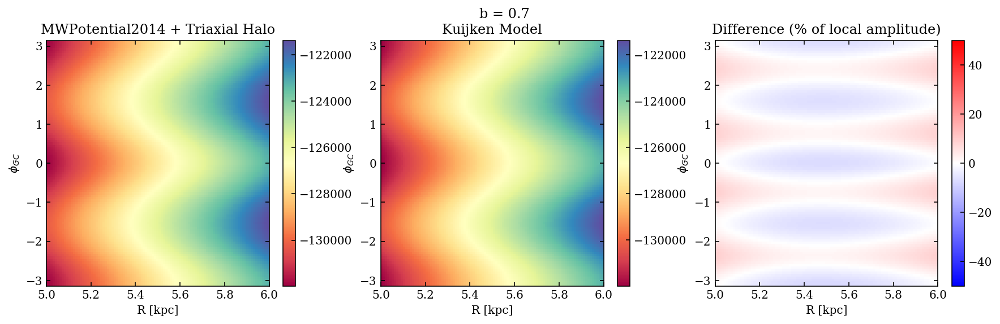

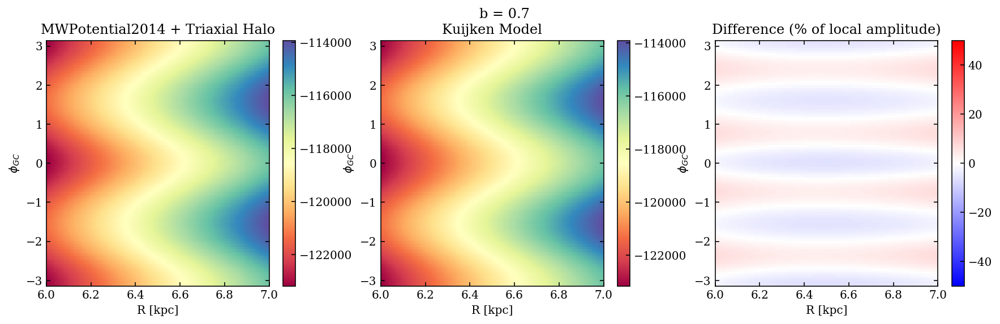

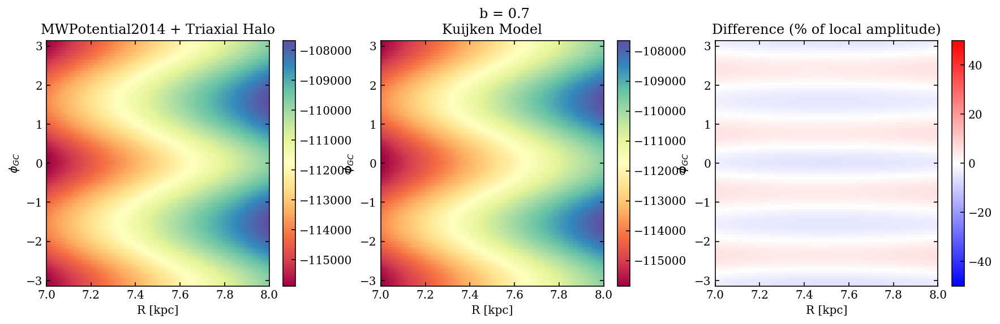

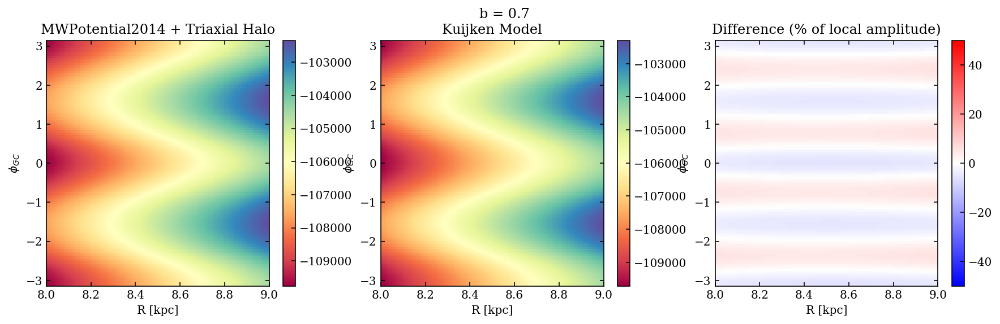

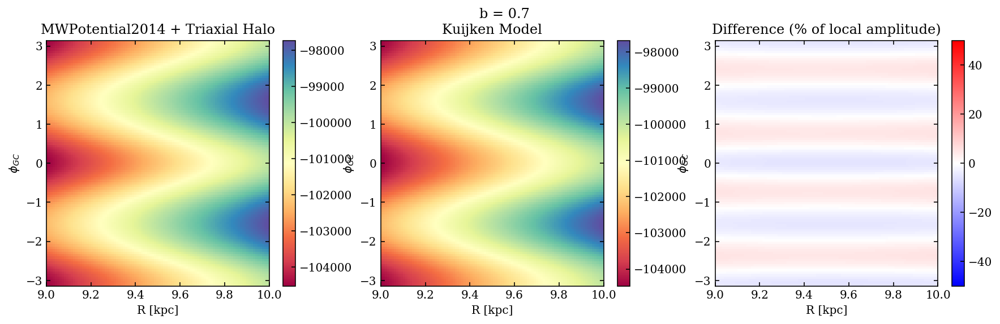

...

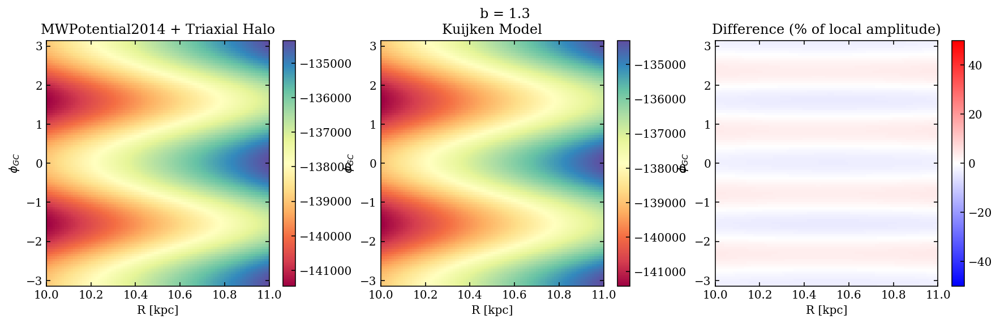

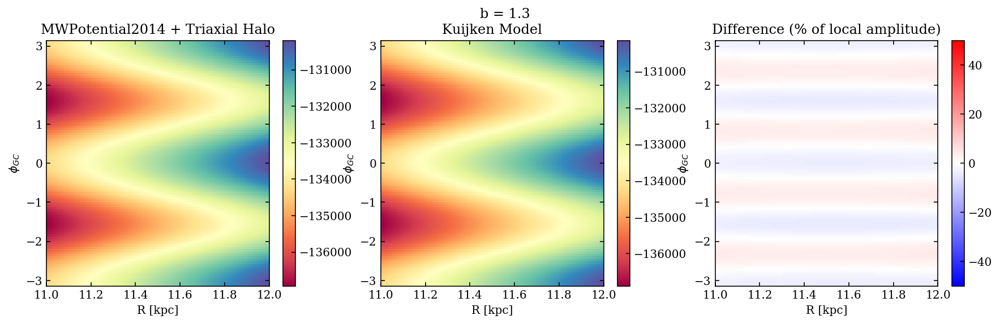

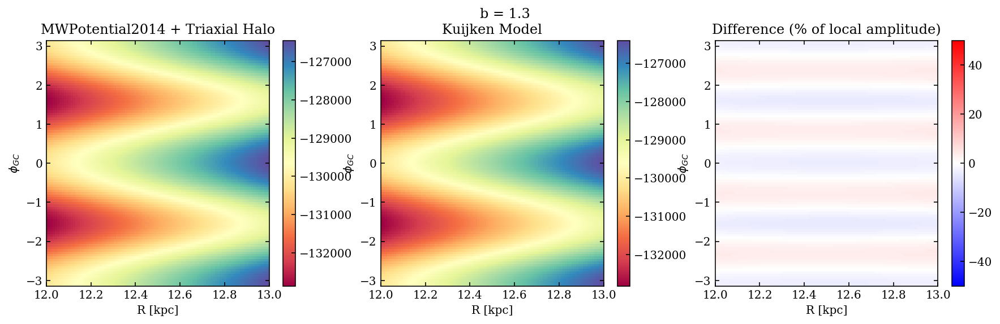

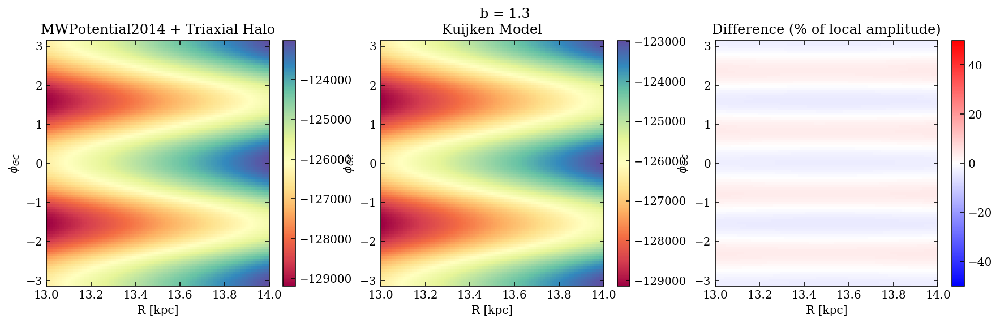

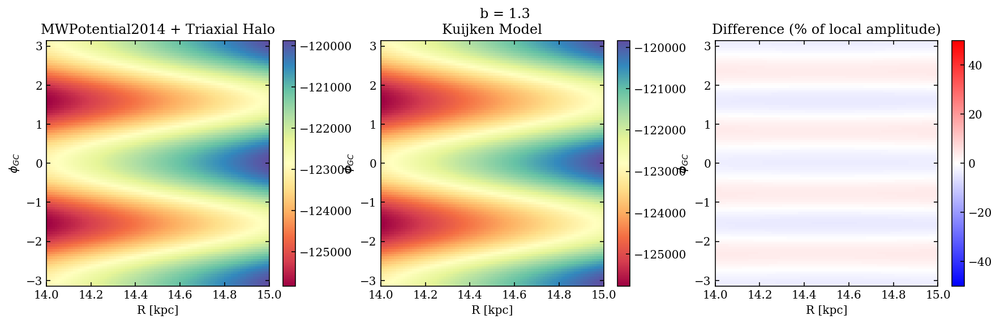

In [29]:
for i in range( n_bs ):
    
    # Make the potential
    mwpot_trihalo = ast1501.potential.make_MWPotential2014_triaxialNFW(halo_b=b_values[i])
    
    for j in range( n_Rs ):
        
        R_hi = R_bin_cents[j]+R_bin_size/2
        R_lo = R_bin_cents[j]-R_bin_size/2
        
        # Make the cutout radial range. Centered on the radial bin
        R_range = np.linspace( R_lo, R_hi, 100 )
        phi_range = np.linspace( phi_limits[0], phi_limits[1], 100 )
        R_mesh, phi_mesh = np.meshgrid( R_range, phi_range )
        mesh_size = R_mesh.shape

        # Make into a 2D array that can be fed into the function
        Rs = R_mesh.flatten()
        phis = phi_mesh.flatten()
        xdata = np.vstack((Rs,phis))
        
        # Make the galpy data
        pot = np.zeros_like(Rs)
        for k in range( len(pot) ):
            pot[k] = potential.evaluatePotentials( mwpot_trihalo, R=Rs[k]/8, z=0, phi=phis[k] ).value
        ###i
        pot_inf = potential.evaluatePotentials( mwpot_trihalo, R=100000, z=0, phi=0 ).value
        pot -= pot_inf

        # Now fit
        popt, pcov = curve_fit(kuijken_model, xdata, pot, p0=[220,-0.19,0,0.38] )

        # Store the output
        print(popt)
        variable_storage[i,j,:] = popt

        # Now plot
        fig = plt.figure( figsize=(15,4) )

        plt.subplot(1, 3, 1)
        plt.title("MWPotential2014 + Triaxial Halo")
        plt.pcolormesh(R_mesh, phi_mesh, pot.reshape(mesh_size), cmap='Spectral')
        plt.axis( [ R_lo, R_hi, phi_limits[0], phi_limits[1] ] )
        plt.xlabel('R [kpc]')
        plt.ylabel(r'$\phi_{GC}$')
        plt.colorbar()

        plt.subplot(1, 3, 2)
        plt.title("Kuijken Model")
        plt.pcolormesh( R_mesh, phi_mesh, kuijken_model(xdata, *popt).reshape(mesh_size), cmap='Spectral' )
        plt.axis( [ R_lo, R_hi, phi_limits[0], phi_limits[1] ] )
        plt.xlabel('R [kpc]')
        plt.ylabel(r'$\phi_{GC}$')
        plt.colorbar()

        plt.subplot(1, 3, 3)
        plt.title("Difference (% of local amplitude)")
        pot_Ravg_sub = pot.reshape(mesh_size) - np.mean( pot.reshape(mesh_size), 0 ) # Average of each R is subtracted
        pot_Ravg_sub_max = np.amax( pot_Ravg_sub, axis=0 )
        pot_Ravg_sub_max_grid = np.repeat( pot_Ravg_sub_max[:, np.newaxis], pot_Ravg_sub_max.shape[0], axis=1)
        plt.pcolormesh( R_mesh, phi_mesh, 
                       100*np.divide(pot.reshape(mesh_size) - kuijken_model(xdata, *popt).reshape(mesh_size),
                                     pot_Ravg_sub_max_grid), cmap='bwr', vmin=-50, vmax=50 
                      )
        plt.axis( [ R_lo, R_hi, phi_limits[0], phi_limits[1] ] )
        plt.xlabel('R [kpc]')
        plt.ylabel(r'$\phi_{GC}$')
        plt.colorbar()

        plt.suptitle('b = '+str(round(b_values[i],2)) )

        pass;
    ###j
###i

## Make a 2D double power law model

$
f(R,b;A_{1},A_{2},k_{1},k_{2},d) = A_{1}R^{k_{1}} + A_{2}b^{k_{2}} + d
$

In [30]:
def double_power_law_fit(x,A1,A2,k1,k2,d):
    return A1*(x[0]**k1) + A2*(x[1]**k2) + d
#def

def double_power_law(R,b,A1,A2,k1,k2,d):
    return A1*(R**k1) + A2*(b**k2) + d
#def

1 are for R
2 are for b
A1 = 47821.6823
A2 = -80.7682
k1 = 0.0004
k2 = -0.238
d = -47561.7654
[ 4.78216823e+04 -8.07681598e+01  4.05882213e-04 -2.37986043e-01
 -4.75617654e+04]


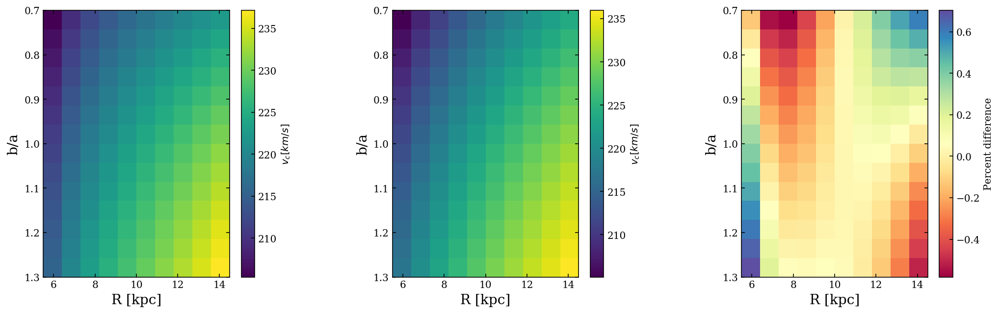

1 are for R
2 are for b
A1 = -74.1244
A2 = 264.674
k1 = 0.0004
k2 = 0.0003
d = -190.6668
[-7.41244033e+01  2.64673977e+02  4.27004574e-04  2.59477216e-04
 -1.90666816e+02]


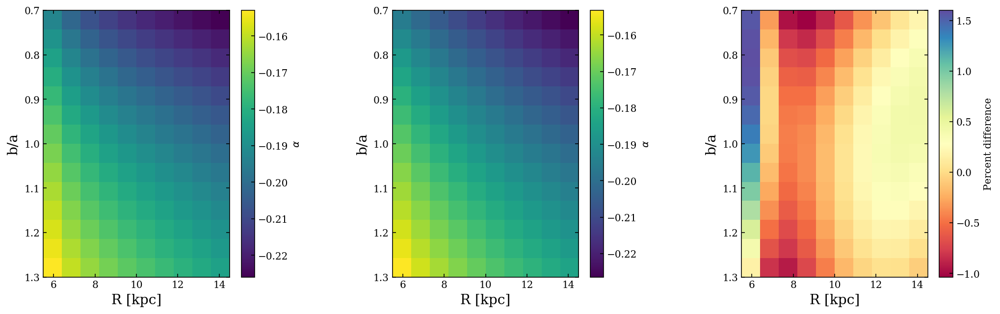

/Users/JamesLane/Software/Python/anaconda3/envs/ast1501-dev/lib/python3.6/site-packages/scipy/optimize/minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)

1 are for R
2 are for b
A1 = 0.7453
A2 = 3105.3521
k1 = -46.414
k2 = 1.2303
d = -3106.3962
[ 7.45313065e-01  3.10535207e+03 -4.64140481e+01  1.23030373e+00
 -3.10639618e+03]


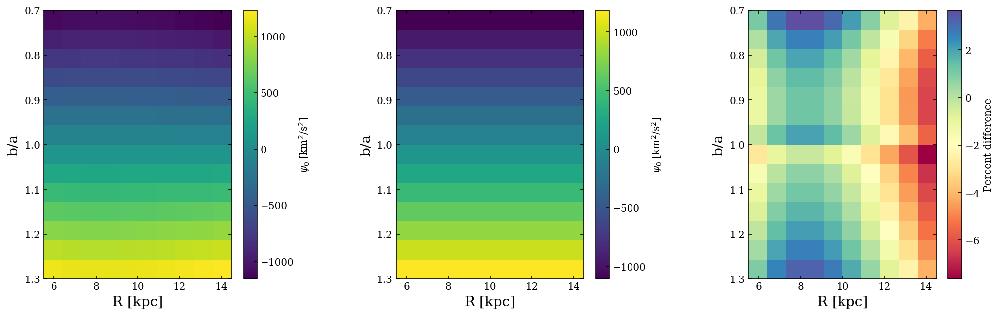

1 are for R
2 are for b
A1 = -0.5482
A2 = -2.7499
k1 = 0.3433
k2 = -0.0691
d = 4.3142
[-0.54815577 -2.74992312  0.34326494 -0.0691154   4.31419703]


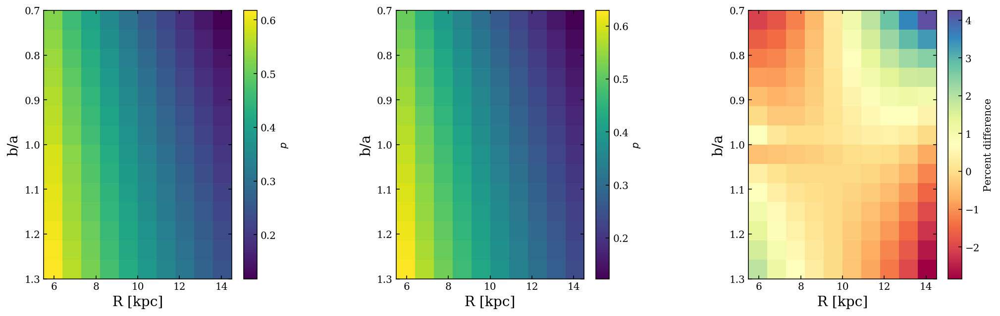

In [31]:
for i in range( n_variables ):
    
    fig = plt.figure( figsize=(17,5) )
    axs = fig.subplots( nrows=1, ncols=3 )
    
    # Now fit a simple power law
    if i < 4:
            
        R_bin_mesh, b_mesh = np.meshgrid(R_bin_cents, b_values)
        fit_mesh_size = R_bin_mesh.shape
        R_bins = R_bin_mesh.flatten()
        bs = b_mesh.flatten()
        fit_data = np.vstack((R_bins,bs))
        
        popt,pcov = curve_fit( double_power_law_fit, fit_data, variable_storage[:,:,i].flatten(), maxfev=10000 )
        fake_z = double_power_law(R_bin_mesh, b_mesh, *popt)
        
        img0 = axs[0].imshow(variable_storage[:,:,i], cmap='viridis', aspect='auto',
                             extent=(np.min(R_bin_cents),np.max(R_bin_cents),np.max(bs),np.min(bs)) )
        axs[0].set_xlabel( 'R [kpc]', fontsize=14 )
        axs[0].set_ylabel( 'b/a', fontsize=14 )
        cbar0 = fig.colorbar(img0, ax=axs[0])
        cbar0.set_label( variable_names[i] )
        
        img1 = axs[1].imshow(fake_z, cmap='viridis', aspect='auto',
                             extent=(np.min(R_bin_cents),np.max(R_bin_cents),np.max(bs),np.min(bs)) )
        axs[1].set_xlabel( 'R [kpc]', fontsize=14 )
        axs[1].set_ylabel( 'b/a', fontsize=14 )
        cbar1 = fig.colorbar(img1, ax=axs[1])
        cbar1.set_label( variable_names[i] )
        
        img2 = axs[2].imshow( 100*np.divide( fake_z-variable_storage[:,:,i], variable_storage[:,:,i] ) , 
                             cmap='Spectral', aspect='auto', 
                             extent=(np.min(R_bin_cents),np.max(R_bin_cents),np.max(bs),np.min(bs)) )
        axs[2].set_xlabel( 'R [kpc]', fontsize=14 )
        axs[2].set_ylabel( 'b/a', fontsize=14 )
        cbar2 = fig.colorbar(img2, ax=axs[2])
        cbar2.set_label( 'Percent difference' )
        
        fig.subplots_adjust(wspace=0.5)
        
        # Print the results
        print('1 are for R')
        print('2 are for b')
        print('A1 = '+str(round(popt[0],4)))
        print('A2 = '+str(round(popt[1],4)))
        print('k1 = '+str(round(popt[2],4)))
        print('k2 = '+str(round(popt[3],4)))
        print('d = '+str(round(popt[4],4)))
        print(popt)
        
    ##fi
    
    plt.show()
    plt.close('all')
###i

## Make a 2D quadratic model

$
f(R,b;A_{1},A_{2},A_{3},A_{4},d) = A_{1}R + A_{2}R^{2} + A_{3}b + A_{4}b^{2} + d
$

In [ ]:
def double_quadratic_fit(x,A1,A2,A3,A4,d):
    return A1*x[0] + A2*x[0]**2 + A3*x[1] + A4*x[1]**2 + d
#def

def double_quadratic(R,b,A1,A2,A3,A4,d):
    return A1*R + A2*R**2 + A3*b + A4*b**2 + d
#def

In [ ]:
for i in range( n_variables ):
    
    fig = plt.figure( figsize=(17,5) )
    axs = fig.subplots( nrows=1, ncols=3 )
    
    # Now fit a simple power law
    if i < 4:
            
        R_bin_mesh, b_mesh = np.meshgrid(R_bin_cents, b_values)
        fit_mesh_size = R_bin_mesh.shape
        R_bins = R_bin_mesh.flatten()
        bs = b_mesh.flatten()
        fit_data = np.vstack((R_bins,bs))
        
        popt,pcov = curve_fit( double_quadratic_fit, fit_data, variable_storage[:,:,i].flatten(), maxfev=10000 )
        fake_z = double_quadratic(R_bin_mesh, b_mesh, *popt)
        
        img0 = axs[0].imshow(variable_storage[:,:,i], cmap='viridis', aspect='auto',
                             extent=(np.min(R_bin_cents),np.max(R_bin_cents),np.max(bs),np.min(bs)) )
        axs[0].set_xlabel( 'R [kpc]', fontsize=14 )
        axs[0].set_ylabel( 'b/a', fontsize=14 )
        cbar0 = fig.colorbar(img0, ax=axs[0])
        cbar0.set_label( variable_names[i] )
        
        img1 = axs[1].imshow(fake_z, cmap='viridis', aspect='auto',
                             extent=(np.min(R_bin_cents),np.max(R_bin_cents),np.max(bs),np.min(bs)) )
        axs[1].set_xlabel( 'R [kpc]', fontsize=14 )
        axs[1].set_ylabel( 'b/a', fontsize=14 )
        cbar1 = fig.colorbar(img1, ax=axs[1])
        cbar1.set_label( variable_names[i] )
        
        img2 = axs[2].imshow( 100*np.divide( fake_z-variable_storage[:,:,i], variable_storage[:,:,i] ) , 
                             cmap='Spectral', aspect='auto', 
                             extent=(np.min(R_bin_cents),np.max(R_bin_cents),np.max(bs),np.min(bs)) )
        axs[2].set_xlabel( 'R [kpc]', fontsize=14 )
        axs[2].set_ylabel( 'b/a', fontsize=14 )
        cbar2 = fig.colorbar(img2, ax=axs[2])
        cbar2.set_label( 'Percent difference' )
        
        fig.subplots_adjust(wspace=0.5)
        
        # Print the results
        print('A1 = '+str(round(popt[0],4)))
        print('A2 = '+str(round(popt[1],4)))
        print('A3 = '+str(round(popt[2],4)))
        print('A4 = '+str(round(popt[3],4)))
        print('d = '+str(round(popt[4],4)))
        print(popt)
        
    ##fi
    
    plt.show()
    plt.close('all')
###i